In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
!pip install folium
!pip install mapclassify


In [ ]:
import geopandas as gpd
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sb
import matplotlib.pyplot as plt
import folium
import mapclassify
import shapefile



In [ ]:
import geopandas as gpd

# Confirmed path to the nybb.shp file inside the ny_boro_boundaries_25d directory
nybb_map = gpd.read_file('/content/drive/MyDrive/Data/ny_boro_boundaries_25d/nybb.shp')

# Display the first few rows of the GeoDataFrame
display(nybb_map.head())

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,325912.288988,1.623618e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,2,Bronx,463147.071763,1.187199e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."
2,4,Queens,887905.076135,3.041419e+09,"MULTIPOLYGON (((1032452.015 154469.237, 103245..."
3,1,Manhattan,359536.412002,6.366312e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,3,Brooklyn,726953.045036,1.934463e+09,"MULTIPOLYGON (((1022227.32 152028.146, 1022078..."


In [ ]:
import os

try:
    print(os.listdir('/content/drive/MyDrive/Data'))
except FileNotFoundError:
    print("Error: The directory '/content/drive/MyDrive/Data' was not found. Please ensure it exists in your Google Drive.")

['NPORS_2025_for_public_release_FINAL.csv', 'ATP-W152.sav', 'OECD_GOV_IND.csv', 'IPUMS_usa_00002.dta', 'ny_boro_boundaries_25d', 'nybb_25d.zip']


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

# List contents of the 'ny_boro_boundaries_25d' directory
try:
    print(os.listdir('/content/drive/MyDrive/Data/ny_boro_boundaries_25d'))
except FileNotFoundError:
    print("Error: The directory '/content/drive/MyDrive/Data/ny_boro_boundaries_25d' was not found. Please check your Google Drive mounting and the path.")


['nybb.prj', 'nybb.shx', 'nybb.shp.xml', 'nybb.shp', 'nybb.dbf']


<Axes: >

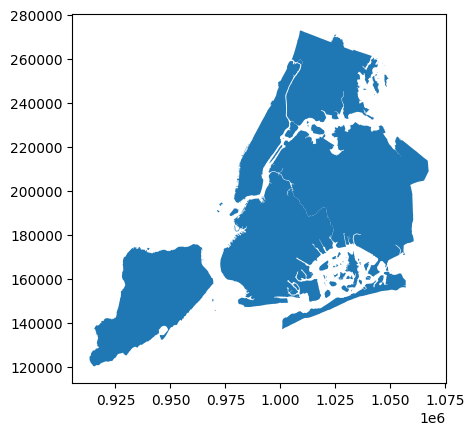

In [ ]:
nybb_map.plot()

In the following three cells I'm exploring a points shapefile from NYC Planning. It is not useful for mapping the geography but it will come in handy when plotting particular proejcts on the NYC map and filtering them by budget.

In [ ]:
# Confirmed path to the nybb.shp file inside the ny_boro_boundaries_25d directory
nycp_map = gpd.read_file('/content/drive/MyDrive/Data/cpdb_projects_pts_25exec/cpdb_projects_pts.shp')

# Display the first few rows of the GeoDataFrame
display(nycp_map.head())

,ccpversion,maprojid,magenacro,magency,magenname,descript,projectid,mindate,maxdate,typecat,...,spccnonex,spccex,spcc,spnccstate,spnccfed,spnccother,spncc,sptotal,sptotalcb,geometry
0,fisa_2025,801JAMSTPLZ,EDC,801,Economic Development Corporation,Station Plaza Design & Construction,JAMSTPLZ,2023-07-11,2028-06-01,Fixed Asset,...,1716163.43,0.0,1716163.43,0.0,0.0,0.0,0.0,1716163.43,1872089.66,MULTIPOINT ((1037559.328 194572.741))
1,fisa_2025,850HLDNODAPT,DDC,850,Department of Design and Construction,ODA PRIMARY HEALTH CARE NETWORK - VEHICLES,HLDNODAPT,2032-06-01,2032-06-01,"ITT, Vehicles, and Equipment",...,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,MULTIPOINT ((996461.917 193257.357))
2,fisa_2025,850HLQNMTEQP,DDC,850,Department of Design and Construction,MOUNT SINAI HOSPITAL OF QUEENS--PURCHASE NEW I...,HLQNMTEQP,2027-06-01,2027-06-01,"ITT, Vehicles, and Equipment",...,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,MULTIPOINT ((997304.342 227242.787))
3,fisa_2025,801JFCSCONEY,EDC,801,Economic Development Corporation,JEWISH BOARD OF FAMILY AND CHILDREN'S SERVICES...,JFCSCONEY,2025-06-01,2025-06-01,Lump Sum,...,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,MULTIPOINT ((1001717.587 236401.212))
4,fisa_2025,850HLXNUNIVR,DDC,850,Department of Design and Construction,UNION COMMUNITY HEALTH CENTER - PURCHASE MOTIO...,HLXNUNIVR,2025-06-01,2025-06-01,"ITT, Vehicles, and Equipment",...,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,MULTIPOINT ((1013025.617 252844.941))


In [ ]:
nycp_map.columns

Index(['ccpversion', 'maprojid', 'magenacro', 'magency', 'magenname',
       'descript', 'projectid', 'mindate', 'maxdate', 'typecat', 'pcccnonex',
       'pcccex', 'pccc', 'pcnccstate', 'pcnccfed', 'pcnccother', 'pcncc',
       'pctotal', 'adccnonex', 'adccex', 'adcc', 'adnccstate', 'adnccfed',
       'adnccother', 'adncc', 'adtotal', 'alccnonex', 'alccex', 'alcc',
       'alnccstate', 'alnccfed', 'alnccother', 'alncc', 'altotal', 'coccnonex',
       'coccex', 'cocc', 'conccstate', 'conccfed', 'conccother', 'concc',
       'cototal', 'spccnonex', 'spccex', 'spcc', 'spnccstate', 'spnccfed',
       'spnccother', 'spncc', 'sptotal', 'sptotalcb', 'geometry'],
      dtype='object')

<Axes: >

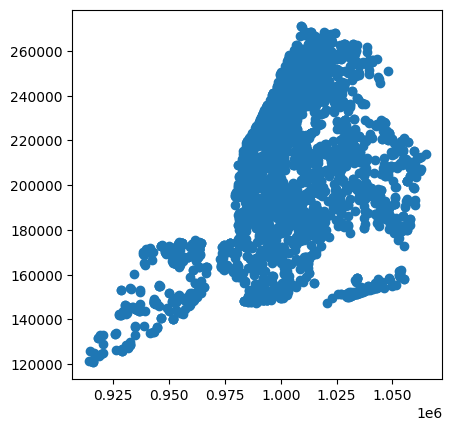

In [ ]:
nycp_map.plot()
# Spatial data at the point level (the points shapefile) is not really useful in this case.
# I will try to stick to the boro boundaries (bb) shapefile and combine this with the csv from NYC Open Data (NOT from NYC Planning)

Now I continue with importing the Capital Projects CSV

In [ ]:
Capital_Projects = pd.read_csv('/content/drive/MyDrive/Data/Capital_Projects_20251204.csv')
# GlobalIndicators_demog = pd.read_csv('/content/drive/MyDrive/Data/demographics_dataset.csv')

In [ ]:
Capital_Projects.columns

Index(['Date Reported As Of', 'PID', 'Project Name', 'Description', 'Category',
       'Borough', 'Managing Agency', 'Client Agency', 'Current Phase',
       'Design Start', 'Budget Forecast', 'Latest Budget Changes',
       'Total Budget Changes', 'Forecast Completion',
       'Latest Schedule Changes', 'Total Schedule Changes'],
      dtype='object')

In [ ]:
Capital_Projects['Date Reported As Of'].value_counts()

,count
Date Reported As Of,
01/2023,363
09/2022,337
04/2022,301
12/2021,282
07/2021,258
03/2021,206
10/2020,196
05/2020,188
01/2020,182


I want to focus on Capital Projects that were reposrted on in 2023

In [ ]:
# Convert 'Date Reported As Of' to datetime objects
Capital_Projects['Date Reported As Of'] = pd.to_datetime(Capital_Projects['Date Reported As Of'], format='%m/%Y')

# Filter for the year 2023
Capital_Projects_2023 = Capital_Projects[Capital_Projects['Date Reported As Of'].dt.year == 2023]

# Display the first few rows of the filtered DataFrame and check the value counts for the year to confirm
display(Capital_Projects_2023.head())
display(Capital_Projects_2023['Date Reported As Of'].dt.year.value_counts())

,Date Reported As Of,PID,Project Name,Description,Category,Borough,Managing Agency,Client Agency,Current Phase,Design Start,Budget Forecast,Latest Budget Changes,Total Budget Changes,Forecast Completion,Latest Schedule Changes,Total Schedule Changes
0,2023-01-01,977,BROWNSVILLE LIBRARY MAJOR RENOVATIONS,The Brownsville Library is a comprehensive int...,Libraries,NaN,DDC,Libraries-BPL,Design,07/27/2018,"$32,254,000",$0,"$6,752,000",07/04/2027,197,916
1,2023-01-01,1366,Design and Construction of Borden Ave PS Force...,Design and Construction of Borden Ave PS Force...,Streets and Roadways,NaN,DDC,Environmental Protection,Design,11/10/2022,"$78,781,000",NaN,NaN,06/07/2028,NaN,NaN
2,2023-01-01,1373,"REPAIRS & REHAB OF INTERCEPTING SEWERS, MN & BX",Repair and Rehabilitation of Interceptor Sewer...,Streets and Roadways,NaN,DDC,Environmental Protection,Construction Procurement,12/10/2012,"$30,611,000",NaN,NaN,06/13/2024,NaN,NaN
3,2023-01-01,97,Bruckner Expressway Westchester Creek Bridge R...,"Replace the existing bridge with a new, wider ...","Bridges, Streets and Roadways",Bronx,DOT,"DEP, DOT",Construction,07/23/2012,"$297,884,658","$6,225,760","$142,277,136",12/27/2023,0,"2,086"
4,2023-01-01,267,Emergency Communications Transformation Progra...,Upgrade and enhancement of emergency technolog...,IT,Citywide,DOITT,"FDNY, NYPD",IT,NaN,"$2,325,426,529.98","$-1,174,838.83","$73,735,148.87",03/01/2024,337,"2,252"


,count
Date Reported As Of,
2023,363


In [ ]:
# Calculate the number of capital projects per borough
projects_per_borough = nybb_capital_projects_map.groupby('BoroName').size().reset_index(name='Project_Count')

# Merge this count back to the original nybb_map for plotting
nybb_map_with_projects = nybb_map.merge(projects_per_borough, on='BoroName', how='left')

# Fill any NaN values (boroughs with no projects) with 0 for better visualization
nybb_map_with_projects['Project_Count'] = nybb_map_with_projects['Project_Count'].fillna(0)

# Display the head of the new GeoDataFrame to verify
display(nybb_map_with_projects.head())

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry,Project_Count
0,5,Staten Island,325912.288988,1.623618e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227....",6
1,2,Bronx,463147.071763,1.187199e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278...",18
2,4,Queens,887905.076135,3.041419e+09,"MULTIPOLYGON (((1032452.015 154469.237, 103245...",14
3,1,Manhattan,359536.412002,6.366312e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940....",14
4,3,Brooklyn,726953.045036,1.934463e+09,"MULTIPOLYGON (((1022227.32 152028.146, 1022078...",15


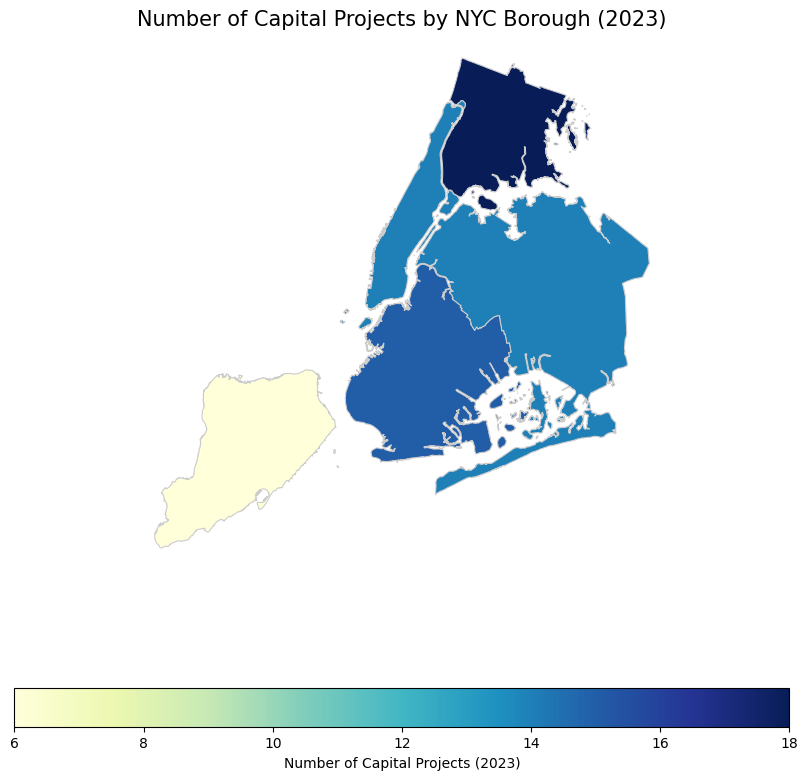

In [ ]:
import matplotlib.pyplot as plt

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot the boroughs, colored by the 'Project_Count' column
nybb_map_with_projects.plot(
    column='Project_Count',
    cmap='YlGnBu',  # Choose a colormap that shows variation well
    linewidth=0.8,
    ax=ax,
    edgecolor='0.8',
    legend=True,
    legend_kwds={'label': "Number of Capital Projects (2023)", 'orientation': "horizontal"}
)

# Add a title
ax.set_title('Number of Capital Projects by NYC Borough (2023)', fontsize=15)

# Remove axis ticks and labels for a cleaner map
ax.set_axis_off()

plt.show()

This code first aggregates your project data by counting the number of projects per borough. Then, it merges these counts with your `nybb_map` (which contains the borough geometries). Finally, it plots a choropleth map where each NYC borough is colored according to the total number of capital projects reported for 2023. You can choose different `cmap` values (color maps) from Matplotlib to change the visualization style.

In [ ]:
# Perform the merge operation
# We'll assign the result to a new GeoDataFrame for clarity
nybb_capital_projects_map = nybb_map.merge(Capital_Projects_2023, left_on='BoroName', right_on='Borough')

# Display the first few rows of the merged GeoDataFrame to see the combined data
display(nybb_capital_projects_map.head())

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry,Date Reported As Of,PID,Project Name,Description,Category,...,Managing Agency,Client Agency,Current Phase,Design Start,Budget Forecast,Latest Budget Changes,Total Budget Changes,Forecast Completion,Latest Schedule Changes,Total Schedule Changes
0,5,Staten Island,325912.288988,1.623618e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227....",2023-01-01,450,Oakwood Beach WWTP Headworks Improvements,"Replacement of six bar screens, grit bin vibra...",Wastewater Treatment,...,DEP,DEP,Design,02/01/2023,"$83,229,440",$0,"$31,867,440",04/25/2029,0,"2,857"
1,5,Staten Island,325912.288988,1.623618e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227....",2023-01-01,364,Hannah Street Pumping Station Construction,This project will reconstruct the Hannah St. P...,Wastewater Treatment,...,DEP,DEP,Construction,08/03/2012,"$109,709,196.8","$6,717,034.57","$67,909,196.8",06/23/2026,174,"3,238"
2,5,Staten Island,325912.288988,1.623618e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227....",2023-01-01,769,Staten Island 1 & 3 Garage Construction & Rehab,The Department of Sanitation of the City of Ne...,Sanitation,...,DDC,Sanitation,Construction,07/14/2017,"$206,699,000","$4,595,000","$68,555,000",03/25/2024,0,406
3,5,Staten Island,325912.288988,1.623618e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227....",2023-01-01,631,CONSTRUCTION OF BMPs NC 6 AND 15 - SI,"CONSTRUCTION OF BMP’s NC 6 AND 15, STORM AND S...",Industrial Development,...,DDC,Environmental Protection,Construction,08/14/2017,"$33,450,000",$0,"$1,921,000",06/09/2024,0,925
4,5,Staten Island,325912.288988,1.623618e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227....",2023-01-01,449,Oakwood Beach WWTP Sludge Thickening Improvements,Replacement of thickener pumps and associated ...,Wastewater Treatment,...,DEP,DEP,Construction Procurement,08/02/2018,"$100,168,119.3","$12,287,925.19","$57,138,101.3",04/27/2027,259,"3,241"


After the merge, your `nybb_capital_projects_map` GeoDataFrame will contain the borough geometries along with all the columns from the `Capital_Projects_2023` DataFrame for each matching borough. You can then use this combined data for mapping or further analysis, for example, to visualize the distribution of capital projects across boroughs.

In [ ]:
# 1. Clean 'Budget Forecast' column in nybb_capital_projects_map
# Remove '$' and ',' and convert to numeric, coercing errors to NaN
nybb_capital_projects_map['Budget_Forecast_Clean'] = nybb_capital_projects_map['Budget Forecast'].str.replace('$', '', regex=False).str.replace(',', '', regex=False).astype(float)

# 2. Fill any NaN values (projects with no budget forecast) with 0
nybb_capital_projects_map['Budget_Forecast_Clean'] = nybb_capital_projects_map['Budget_Forecast_Clean'].fillna(0)

# 3. Aggregate total 'Budget Forecast' per borough
borough_budget_forecast = nybb_capital_projects_map.groupby('BoroName')['Budget_Forecast_Clean'].sum().reset_index(name='Total_Budget_Forecast')

# 4. Merge this aggregated budget back to the original nybb_map for plotting
nybb_map_with_budget = nybb_map.merge(borough_budget_forecast, on='BoroName', how='left')

# Fill any NaN values (boroughs with no projects or budget) with 0 for better visualization
nybb_map_with_budget['Total_Budget_Forecast'] = nybb_map_with_budget['Total_Budget_Forecast'].fillna(0)

# Display the head of the new GeoDataFrame to verify
display(nybb_map_with_budget.head())

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry,Total_Budget_Forecast
0,5,Staten Island,325912.288988,1.623618e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227....",6.274468e+08
1,2,Bronx,463147.071763,1.187199e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278...",2.416825e+09
2,4,Queens,887905.076135,3.041419e+09,"MULTIPOLYGON (((1032452.015 154469.237, 103245...",1.506137e+09
3,1,Manhattan,359536.412002,6.366312e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940....",1.768841e+09
4,3,Brooklyn,726953.045036,1.934463e+09,"MULTIPOLYGON (((1022227.32 152028.146, 1022078...",3.542422e+09


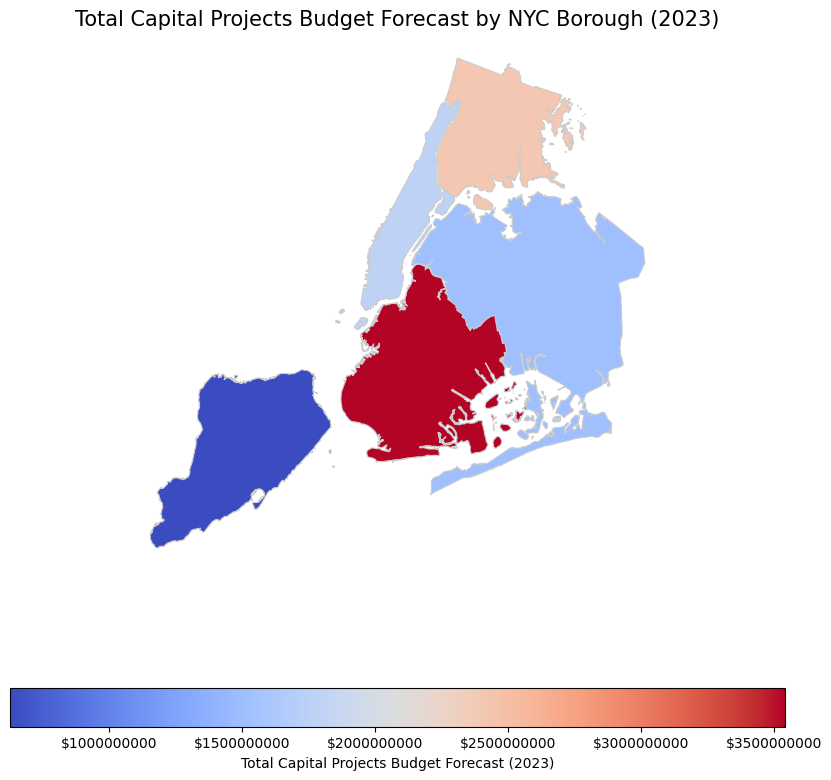

In [ ]:
import matplotlib.pyplot as plt

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot the boroughs, colored by the 'Total_Budget_Forecast' column
nybb_map_with_budget.plot(
    column='Total_Budget_Forecast',
    cmap='coolwarm',
    linewidth=0.8,
    ax=ax,
    edgecolor='0.8',
    legend=True,
    legend_kwds={'label': "Total Capital Projects Budget Forecast (2023)", 'orientation': "horizontal", 'format': "$%.0f"}
)

# Add a title
ax.set_title('Total Capital Projects Budget Forecast by NYC Borough (2023)', fontsize=15)

# Remove axis ticks and labels for a cleaner map
ax.set_axis_off()

plt.show()

This code first cleans the 'Budget Forecast' column, converts it to a numeric type, and then sums the total budget for all projects within each borough. It then merges this sum back with the borough geometries and plots a choropleth map. The `viridis` colormap is used here, but you can explore others from Matplotlib's documentation to find one that best suits your visualization needs.

Brooklyn has, by a wide margin, the largest forcast budget for Capital Projects. The map above gives us CP budget information only on borough level because the shapefile we read in and use for this viz is the bb map. Below, I will want to explore budget allocations in more detail. That's when I'll use the CP shapefile we read in earlier - cpdb_projects_pts.shp - which shows spatial data at the point level.

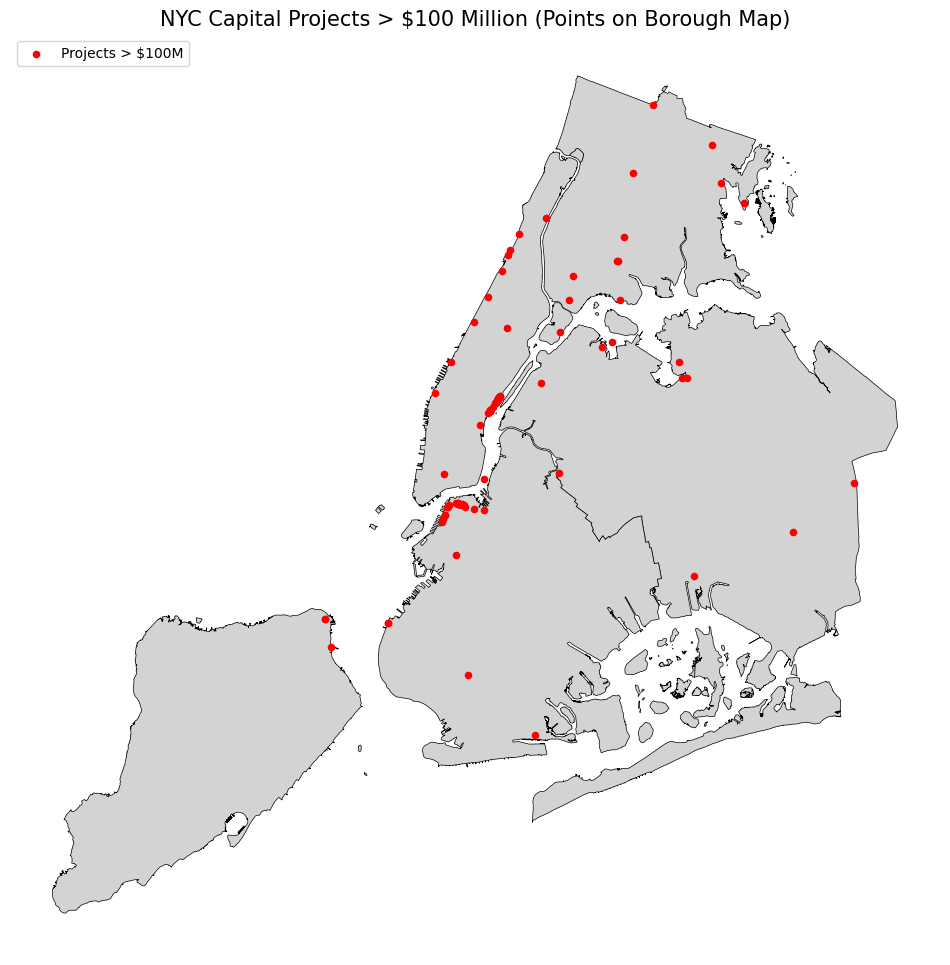

In [ ]:
import matplotlib.pyplot as plt

# 1. Filter projects with pctotal > $100,000,000
high_budget_projects = nycp_map[nycp_map['pctotal'] > 100000000]

# 2. Set up the plot
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Plot the NYC boroughs as the base layer
# Using nybb_map directly for a clean base without previous choropleth coloring
nybb_map.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.5)

# Overlay the high-budget projects as dots
high_budget_projects.plot(
    ax=ax,
    marker='o',         # Use circles for points
    color='red',        # Color the points red
    markersize=20,      # Adjust marker size as needed
    label='Projects > $100M',
    legend=True
)

# Add a title
ax.set_title('NYC Capital Projects > $100 Million (Points on Borough Map)', fontsize=15)

# Remove axis ticks and labels for a cleaner map
ax.set_axis_off()

plt.legend(loc='upper left')
plt.show()

In [ ]:
# Check the number of projects in the filtered GeoDataFrame
print(f"Number of high-budget projects to plot: {len(high_budget_projects_geo)}")

# Display the head of the GeoDataFrame to inspect if there's data
display(high_budget_projects_geo.head())

Number of high-budget projects to plot: 46


,ccpversion,maprojid,magenacro,magency,magenname,descript,projectid,mindate,maxdate,typecat,...,spccnonex,spccex,spcc,spnccstate,spnccfed,spnccother,spncc,sptotal,sptotalcb,geometry
138,fisa_2025,826OH-88-L,DEP,826,Department of Environmental Protection,RECONSTRUCTION OF FINAL TANKS AT OWLS HEAD WPCP,OH-88-L,2025-06-01,2035-06-01,Fixed Asset,...,0.0,370845.30,370845.30,0.0,0.0,0.0,0.0,370845.30,0.00,MULTIPOINT ((-74.03525 40.64183))
139,fisa_2025,826OH-91-L,DEP,826,Department of Environmental Protection,RECONSTRUCTION OF SEA WALL AND DOCK @ OWLS HEA...,OH-91-L,2018-02-12,2028-06-01,Fixed Asset,...,0.0,60367796.56,60367796.56,0.0,0.0,0.0,0.0,60367796.56,56429646.50,MULTIPOINT ((-74.03525 40.64183))
142,fisa_2025,826PR-134-L,DEP,826,Department of Environmental Protection,RECONSTRUCT FINAL SETTLING SYSTEM EQUIPMENT @ ...,PR-134-L,2025-06-01,2035-06-01,"ITT, Vehicles, and Equipment",...,0.0,620000.00,620000.00,0.0,0.0,0.0,0.0,620000.00,0.00,MULTIPOINT ((-74.07659 40.64356))
199,fisa_2025,826HP-239-L,DEP,826,Department of Environmental Protection,RECONSTRUCT SLUDGE HANDLING EQUIPMENT @ HUNTS ...,HP-239-L,2023-06-06,2035-06-01,"ITT, Vehicles, and Equipment",...,0.0,5235480.70,5235480.70,0.0,0.0,0.0,0.0,5235480.70,5266881.91,MULTIPOINT ((-73.88297 40.80324))
228,fisa_2025,826PS-290,DEP,826,Department of Environmental Protection,CONNER STREET PUMPING STATION,PS-290,2025-06-01,2032-06-01,Fixed Asset,...,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,MULTIPOINT ((-73.82165 40.88065))


Now let's make an **interactive map**!! ✨

In [ ]:
import folium

# 1. Filter projects with pctotal > $100,000,000
high_budget_projects = nycp_map[nycp_map['pctotal'] > 100000000]

# 2. Ensure Correct CRS for Folium (WGS84 - EPSG:4326)
# Check if CRS is already 4326, if not, convert
if high_budget_projects.crs is None or high_budget_projects.crs.to_epsg() != 4326:
    if nycp_map.crs is None:
        high_budget_projects = high_budget_projects.set_crs(epsg=2263, allow_override=True)
    high_budget_projects_geo = high_budget_projects.to_crs(epsg=4326)
else:
    high_budget_projects_geo = high_budget_projects.copy()

# Also prepare the borough map for Folium
if nybb_map.crs is None or nybb_map.crs.to_epsg() != 4326:
    if nybb_map.crs is None:
        nybb_map = nybb_map.set_crs(epsg=2263, allow_override=True)
    nybb_map_geo = nybb_map.to_crs(epsg=4326)
else:
    nybb_map_geo = nybb_map.copy()

# 3. Create Base Folium Map - center it on NYC
# Calculate the centroid of the high_budget_projects for initial map centering
if not high_budget_projects_geo.empty:
    # Filter to ensure only valid Point geometries are used for centering
    # Need to handle MultiPoint geometries as well, take the first point if MultiPoint
    points_for_centering_data = high_budget_projects_geo[
        (high_budget_projects_geo.geometry.geom_type == 'Point') |
        (high_budget_projects_geo.geometry.geom_type == 'MultiPoint')
    ].dropna(subset=['geometry'])

    if not points_for_centering_data.empty:
        # For MultiPoint, take the first point of each MultiPoint for centering calculation
        center_points = points_for_centering_data.geometry.apply(lambda geom: geom.geoms[0] if geom.geom_type == 'MultiPoint' else geom)
        center_lat = center_points.y.mean()
        center_lon = center_points.x.mean()
    else:
        # Fallback to default NYC if no valid points for centering
        center_lat = 40.7128
        center_lon = -74.0060
else:
    # Default NYC coordinates if no high budget projects
    center_lat = 40.7128
    center_lon = -74.0060

m = folium.Map(location=[center_lat, center_lon], zoom_start=10)

# 4. Add Borough Boundaries to the map as a GeoJson layer
folium.GeoJson(
    nybb_map_geo,
    name='NYC Boroughs',
    style_function=lambda x: {'fillColor': '#cccccc', 'color': 'black', 'weight': 0.5, 'fillOpacity': 0.3}
).add_to(m)

# 5. Create a FeatureGroup for the markers so they can be toggled
projects_layer = folium.FeatureGroup(name='High Budget Projects > $100M').add_to(m)

# 6. Add Project Markers with Tooltips to the FeatureGroup
for idx, row in high_budget_projects_geo.iterrows():
    # Check for valid geometry before adding marker
    # Handle both Point and MultiPoint geometries
    if row.geometry and not row.geometry.is_empty:
        lat = None
        lon = None

        if row.geometry.geom_type == 'Point':
            lat = row.geometry.y
            lon = row.geometry.x
        elif row.geometry.geom_type == 'MultiPoint' and row.geometry.geoms: # Check if MultiPoint has at least one point
            # For MultiPoint, use the coordinates of the first point
            first_point = row.geometry.geoms[0]
            lat = first_point.y
            lon = first_point.x

        if lat is not None and lon is not None: # Only add marker if valid lat/lon found
            # Create tooltip content
            tooltip_content = f"<b>Project Name:</b> {row['descript']}<br>"
            tooltip_content += f"<b>Total Planned Commitment:</b> ${row['pctotal']:,}<br>"
            tooltip_content += f"<b>Project ID:</b> {row['projectid']}"

            folium.Marker(
                location=[lat, lon],
                tooltip=tooltip_content,
                icon=folium.Icon(color='red', icon='info-sign')
            ).add_to(projects_layer) # Add marker to the feature group

# Add LayerControl to toggle layers
folium.LayerControl().add_to(m)

# Display the map
display(m)

In [ ]:
print('Geometry types in high_budget_projects_geo:')
print(high_budget_projects_geo.geometry.geom_type.value_counts())

print('\nSample coordinates (first 5 points):')
for idx, row in high_budget_projects_geo.head().iterrows():
    if row.geometry and row.geometry.geom_type == 'Point':
        print(f"Lat: {row.geometry.y:.4f}, Lon: {row.geometry.x:.4f}")
    elif row.geometry and row.geometry.geom_type == 'MultiPoint': # Handle MultiPoint if present
        # Just take the first point for demonstration
        if row.geometry.geoms:
            first_point = row.geometry.geoms[0]
            print(f"MultiPoint (first geom) Lat: {first_point.y:.4f}, Lon: {first_point.x:.4f}")
        else:
            print("MultiPoint (empty)")
    else:
        print(f"Non-Point/Empty Geometry: {row.geometry.geom_type}")

# Check bounding box for all points
min_lon, min_lat, max_lon, max_lat = high_budget_projects_geo.total_bounds
print(f"\nTotal Bounding Box (Lon, Lat): [{min_lon:.4f}, {min_lat:.4f}, {max_lon:.4f}, {max_lat:.4f}]")

Geometry types in high_budget_projects_geo:
MultiPoint    46
Name: count, dtype: int64

Sample coordinates (first 5 points):
MultiPoint (first geom) Lat: 40.6418, Lon: -74.0353
MultiPoint (first geom) Lat: 40.6418, Lon: -74.0353
MultiPoint (first geom) Lat: 40.6436, Lon: -74.0766
MultiPoint (first geom) Lat: 40.8032, Lon: -73.8830
MultiPoint (first geom) Lat: 40.8807, Lon: -73.8217

Total Bounding Box (Lon, Lat): [-74.0766, 40.5857, -73.7286, 40.9008]


This code generates an interactive Folium map. It first filters for projects with `pctotal` greater than $100,000,000 and ensures both project points and borough boundaries are in the correct coordinate system (WGS84). Then, it creates a base map, adds the borough boundaries, and finally overlays red markers for each high-budget project. When you hover your mouse over these red markers, a tooltip will appear displaying the 'Project Name', 'Total Planned Commitment' and 'Project ID'.

This code first filters the `nycp_map` to include only projects where the `pctotal` (planned commitment total) exceeds $100,000,000. Then, it plots the NYC borough boundaries as a light grey base map and overlays these filtered high-budget projects as red dots. The legend helps distinguish the project markers.

**SOME OBSERVATIONS AND QUESTIONS....**

This is maybe getting too much in the weeds of mapping but....

The interacive map shows less red dots that the static grey map, even though the dots in both represent projects with forecast budget >$100,000,000.

This is *what Gemini says* - subtle but important difference in how **MultiPoint** geometries are handled by the two plotting methods!

Here's the likely reason for seeing fewer red dots in Brooklyn on the interactive Folium map compared to the static Matplotlib map:

Static Matplotlib Map (geopandas.plot()): When you use geopandas.plot() with a GeoDataFrame containing MultiPoint geometries and specify a marker (like 'o'), Matplotlib typically plots a marker for each individual point that makes up the MultiPoint geometry. So, if a single project (one row in your data) has a MultiPoint geometry consisting of, say, 5 distinct locations, the static map would draw 5 red dots for that one project.

Interactive Folium Map (folium.Marker()): In our Folium code, for each MultiPoint geometry representing a project, we are explicitly taking only the first constituent point (row.geometry.geoms[0]) to place a single folium.Marker. This means that even if a MultiPoint geometry contains multiple locations, only one red dot is placed on the map for that project.

Therefore, if projects in Brooklyn (or any other borough) are frequently represented by MultiPoint geometries that encompass several distinct locations, the static map would show all those individual locations as separate dots, while the interactive map would consolidate them into a single dot per project. This would lead to the interactive map appearing to have fewer red dots.

To verify this, you could inspect some of the MultiPoint geometries in your high_budget_projects_geo DataFrame and check how many individual points they contain. For example, len(high_budget_projects_geo.iloc[0].geometry.geoms) would tell you how many points are in the first MultiPoint geometry.

In [ ]:
len(high_budget_projects_geo.iloc[0].geometry.geoms)
# means that the first MultiPoint geometry in my DataFrame is, in effect, a single point.

1